In [107]:
import pandas as pd
import altair as alt

In [108]:
windTurbine = pd.read_csv("data/opendata_wka_ib_gv_vb_sh_k_20231011.csv", sep=";")

In [109]:
windTurbine.head()

,KREIS,GEMEINDE,TYP,HERSTELLER,NABENHOEHE,ROTORDURCHMESSER,SCHALLLEISTUNGSPEGEL,LEISTUNG,LEISTUNGSBEZUG,OSTWERT,NORDWERT,GENEHMIGT_AM,INBETRIEBNAHME,STATUS,BST_NR,ANL_NR,AKTENZEICHEN,DATENDATUM,DATENQUELLE
0,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134,131,NaN,3000,kW Nennleist. Rotor.,571605,6013660,NaN,NaN,im Gen.Verf.,2000000317,1,G20/2016/085,10.10.2023,"LfU SH, Abtl. 7"
1,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134,131,NaN,3000,kW Nennleist. Rotor.,572117,6013490,NaN,NaN,im Gen.Verf.,2000000317,2,G20/2016/086,10.10.2023,"LfU SH, Abtl. 7"
2,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134,131,NaN,3000,kW Nennleist. Rotor.,572497,6013607,NaN,NaN,im Gen.Verf.,2000000317,3,G20/2016/087,10.10.2023,"LfU SH, Abtl. 7"
3,Lübeck,Lübeck,Enercon E 82 E,Enercon,78,82,"104,5 dB(A)",2300,kW Nennleist. Rotor.,619817,5978875,01.04.2011,25.09.2012,in Betrieb,3000924205,1,G30/031/2010,10.10.2023,"LfU SH, Abtl. 7"
4,Lübeck,Lübeck,Enercon E-82 E,Enercon,85,82,"104,5",2300,kW Nennleist. Rotor.,619815,5977994,01.04.2011,25.09.2012,in Betrieb,3000924205,2,G30/030/2010,10.10.2023,"LfU SH, Abtl. 7"


# Data Cleaning and preperation

In [110]:
# data cleanup
# convertig the NABENHOEHE, ROTORDURCHMESSER from string to float and replace the ',' with '.'
windTurbine["NABENHOEHE"] = windTurbine["NABENHOEHE"].str.replace(",", ".").astype(float)
windTurbine["ROTORDURCHMESSER"] = windTurbine["ROTORDURCHMESSER"].str.replace(",", ".").astype(float)

In [111]:
# transform inbetriebnahme to datetime dd.mm.yyyy
windTurbine["GENEHMIGT_AM"] = pd.to_datetime(windTurbine["GENEHMIGT_AM"], format="%d.%m.%Y")
windTurbine["INBETRIEBNAHME"] = pd.to_datetime(windTurbine["INBETRIEBNAHME"], format="%d.%m.%Y")
windTurbine["DATENDATUM"] = pd.to_datetime(windTurbine["DATENDATUM"], format="%d.%m.%Y")

In [112]:
windTurbine

,KREIS,GEMEINDE,TYP,HERSTELLER,NABENHOEHE,ROTORDURCHMESSER,SCHALLLEISTUNGSPEGEL,LEISTUNG,LEISTUNGSBEZUG,OSTWERT,NORDWERT,GENEHMIGT_AM,INBETRIEBNAHME,STATUS,BST_NR,ANL_NR,AKTENZEICHEN,DATENDATUM,DATENQUELLE
0,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134.0,131.0,NaN,3000,kW Nennleist. Rotor.,571605,6013660,NaT,NaT,im Gen.Verf.,2000000317,1,G20/2016/085,2023-10-10,"LfU SH, Abtl. 7"
1,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134.0,131.0,NaN,3000,kW Nennleist. Rotor.,572117,6013490,NaT,NaT,im Gen.Verf.,2000000317,2,G20/2016/086,2023-10-10,"LfU SH, Abtl. 7"
2,Kiel,Kiel,"Nordex N131 - 3,0 MW",Nordex,134.0,131.0,NaN,3000,kW Nennleist. Rotor.,572497,6013607,NaT,NaT,im Gen.Verf.,2000000317,3,G20/2016/087,2023-10-10,"LfU SH, Abtl. 7"
3,Lübeck,Lübeck,Enercon E 82 E,Enercon,78.0,82.0,"104,5 dB(A)",2300,kW Nennleist. Rotor.,619817,5978875,2011-04-01,2012-09-25,in Betrieb,3000924205,1,G30/031/2010,2023-10-10,"LfU SH, Abtl. 7"
4,Lübeck,Lübeck,Enercon E-82 E,Enercon,85.0,82.0,"104,5",2300,kW Nennleist. Rotor.,619815,5977994,2011-04-01,2012-09-25,in Betrieb,3000924205,2,G30/030/2010,2023-10-10,"LfU SH, Abtl. 7"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3939,Stormarn,Feldhorst,Jacobs MD 70,Jacobs,65.0,70.0,103,1500,kW Nennleist. Rotor.,593273,5969688,2002-08-14,2002-12-01,in Betrieb,62093445249,2,G30/028/2001-L108,2023-10-10,"LfU SH, Abtl. 7"
3940,Stormarn,Feldhorst,Jacobs MD 70,Jacobs,65.0,70.0,103,1500,kW Nennleist. Rotor.,593509,5969619,2002-08-14,2002-12-01,in Betrieb,62093445249,3,G30/028/2001-L108,2023-10-10,"LfU SH, Abtl. 7"
3941,Stormarn,Feldhorst,Jacobs MD 70,Jacobs,65.0,70.0,103,1500,kW Nennleist. Rotor.,594038,5969465,2002-08-14,2002-12-01,in Betrieb,62093445249,4,G30/028/2001-L108,2023-10-10,"LfU SH, Abtl. 7"
3942,Stormarn,Feldhorst,Jacobs MD 70,Jacobs,65.0,70.0,103,1500,kW Nennleist. Rotor.,594262,5969348,2002-08-14,2002-12-01,in Betrieb,62093445249,5,G30/028/2001-L108,2023-10-10,"LfU SH, Abtl. 7"


In [113]:
windTurbine["STATUS"].unique()

array(['im Gen.Verf.', 'in Betrieb', 'vor Inbetriebnahme'], dtype=object)

In [138]:
# the wind turbine with Inbetriebnhame on 1996-04-01 looks kinda sus since its is the type Tacke TW 600 
# but it shows that it produces 6000kw wich is alot for that date
# my resarch found out that the tacke tw 600 only has 600kw so we are going to correct it

#print(windTurbine[windTurbine["INBETRIEBNAHME"] == "1996-04-01"].head())

#correct the LEISTUNG to 600 for Entry 2900
windTurbine.loc[2900, "LEISTUNG"] = 600

In [116]:
# since there are 33 wind turbines with an older inbetriebnahme date than 1910 we are going to create a new
# dataframe for date analysis that does not consider these turbines
windTurbineDate = windTurbine[windTurbine["INBETRIEBNAHME"] > "1960-01-01"]

# they are also 10 turbines with a GENEHMIGT_AM date older than 1910 but with an Inbetriebnahme younger than 1910
# we are going to drop these turbines
windTurbineDate = windTurbineDate[windTurbineDate["GENEHMIGT_AM"] > "1960-01-01"]

In [117]:
# converting the used coordinates into lat/lon using pyproj
import pyproj

def convert_coordinates(df, easting_col, northing_col):
    # Define the projections
    utm_proj = pyproj.Proj(proj='utm', zone=32, ellps='WGS84')  # UTM coordinates (assuming zone 32)
    latlong_proj = pyproj.Proj(proj='latlong', datum='WGS84')  # LatLon with WGS84 datum used by GPS units and Google Earth

    # Apply the conversion to each row in the dataframe
    df['Longitude'], df['Latitude'] = pyproj.transform(utm_proj, latlong_proj, df[easting_col].values, df[northing_col].values)

    return df

# Convert the coordinates
windTurbine = convert_coordinates(windTurbine, 'OSTWERT', 'NORDWERT')



/tmp/ipykernel_785/2364807012.py:10: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  df['Longitude'], df['Latitude'] = pyproj.transform(utm_proj, latlong_proj, df[easting_col].values, df[northing_col].values)


In [118]:
chart = alt.Chart(windTurbine).mark_circle(aspect=True).encode(
    x='NABENHOEHE',
    y='LEISTUNG',
    size='ROTORDURCHMESSER',
    tooltip=['NABENHOEHE', 'ROTORDURCHMESSER', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

chart


alt.Chart(...)

In [119]:
import altair as alt

# Load a map of Germany
germany_map = alt.topo_feature('https://github.com/isellsoap/deutschlandGeoJSON/blob/main/1_deutschland/1_sehr_hoch.geo.json', 'features')

# Create a chart object
chart = alt.Chart(germany_map).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('identity').properties(
    width=500,
    height=300
)

# Create a points object
points = alt.Chart(windTurbine).mark_circle().encode(
    longitude='Longitude:Q',
    latitude='Latitude:Q',
    tooltip=['Latitude', 'Longitude']
).properties(
    title='Wind Turbines in Schleswig-Holstein, Germany'
)

# Display the map
chart + points



alt.LayerChart(...)

In [120]:
import folium

# Create a map centered around Schleswig-Holstein
m = folium.Map(location=[54.2194, 9.6961], zoom_start=7)

# Add points for each wind turbine
for index, row in windTurbine.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']]).add_to(m)

# Display the map
m


In [121]:
# print all possible values for SCHALLLEISTUNG as json
import json
print(json.dumps(windTurbine["SCHALLLEISTUNGSPEGEL"].unique().tolist()))


[NaN, "104,5 dB(A)", "104,5", "98,3", "HZ /dB(A) | 63/81,2 | 125/87 | 250/92,2 | 500/96,2 | 1000/97 | 2000/94,9 | 4000/87,4 | 8000/ | SLP=101,8 dB(A); 108,5 dB(A)", "106,5 dB(A)/106,5 dB(A)", "106,5 dB(A)/104,8 dB(A)", "105,6 dB(A)/105,6 dB(A)", "NUR TAGBETRIEB MIT: HZ /dB(A) | 63/86,2 | 125/95 | 250/99,3 | 500/102,5 | 1000/101,2 | 2000/99,2 | 4000/94,9 | 8000/ | SLP=107,4 dB(A)", "105,6dB(A)/105,6 dB(A)", "103", "106,0 dB(A), 104,4dB(A)", "106,0 dB(A), 106,0 dB(A)", "106dB(A), 106dB(A)", "106,0 dB(A), 104,0 dB(A) ", "105,2 dB(A), 103,7dB(A)", "105,2 dB(A), 105,2dB(A)", "105,2 dB(A)/105,2 dB(A)", "105,2 dB(A), 104,3dB(A)", "105,2 dB(A), 104,7dB(A)", "105,2 dB(A), 103,3dB(A)", "105,2 dB(A), 104,2 dB(A)", "105,2 dB(A), 104,0dB(A)", "105,2 dB(A), 105,2 dB(A)", "105,6 dB(A), 100 dB(A)", "104 dB(A)tags; 103 dB(A) nachts", "104dB(A) tags; 103,8dB(A) nachts ", "104dB(A) tags; 103,8 dB(A) nachts", "104dB(A) tags; 102,5dB(A) nachts", "104dB(A) tags; 99,5dB(A) nachts", "104dB(A) tags; 103,4dB(A)

In [122]:
import pandas as pd
import numpy as np
import re

# Assuming windTurbine is your DataFrame and "SCHALLLEISTUNGSPEGEL" is your column
unique_values = windTurbine["SCHALLLEISTUNGSPEGEL"].unique().tolist()

def split_hz_db(value):
    if pd.isnull(value):
        return np.nan, np.nan
    else:
        hz_db_pairs = re.findall(r'(\d+)/(\d+,\d+)', value)
        hz_values = [pair[0] for pair in hz_db_pairs]
        db_values = [pair[1] for pair in hz_db_pairs]
        return hz_values, db_values

windTurbine['hz_values'], windTurbine['db_values'] = zip(*windTurbine['SCHALLLEISTUNGSPEGEL'].map(split_hz_db))


<Axes: ylabel='count'>

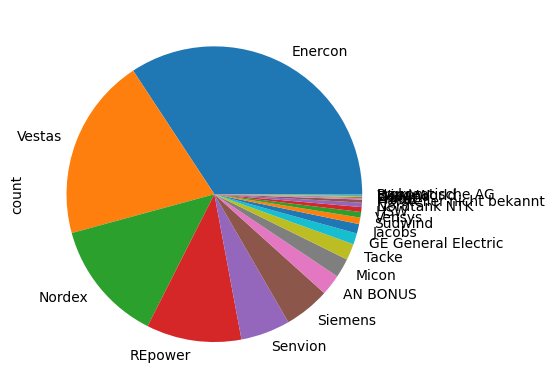

In [123]:
# print distrubition of the wind turbine manufacturers
windTurbine["HERSTELLER"].value_counts().plot(kind="pie")

In [140]:
# plot INBETRIEBNAHME and LEISTUNG with altair
import altair as alt


alt.Chart(windTurbineDate).mark_circle().encode(
    x='INBETRIEBNAHME',
    y='LEISTUNG',
    tooltip=['INBETRIEBNAHME', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

alt.Chart(...)

In [126]:
import altair as alt
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# Assuming windTurbine is your DataFrame and it has been loaded properly

# Calculate the difference in days between 'INBETRIEBNAHME' and 'GENEHMIGT_AM'
windTurbineDate['Time_Difference'] = (windTurbineDate['INBETRIEBNAHME'] - windTurbineDate['GENEHMIGT_AM']).dt.days

# Fill NaN values with the mean
windTurbineDate['Time_Difference'].fillna((windTurbineDate['Time_Difference'].mean()), inplace=True)

# Create a new column for the year
windTurbineDate['Year'] = windTurbineDate['GENEHMIGT_AM'].dt.year

# Group by Year and calculate the mean time difference
grouped = windTurbineDate.groupby('Year')['Time_Difference'].mean().reset_index()

# Create a LOESS trend line
X = grouped['Year'].values.reshape(-1,1)
y = grouped['Time_Difference'].values
model = make_pipeline(PolynomialFeatures(3), LinearRegression())
model.fit(X, y)
y_pred = model.predict(X)

# Create the chart
base = alt.Chart(grouped).encode(
    x=alt.X('Year', title='Year'),
    y=alt.Y('Time_Difference', title='Average Time Difference (in days)'),
    tooltip=['Year', 'Time_Difference']
)

line = base.mark_line().encode(
    x='Year',
    y='Time_Difference'
)

trend_line = alt.Chart(pd.DataFrame({'Year': grouped['Year'], 'Trend': y_pred})).mark_line(color='red').encode(
    x='Year',
    y='Trend'
)

chart = (line + trend_line).properties(
    title='Average Time Difference from Approval to First Energy Produced Over the Years'
)

chart


alt.LayerChart(...)

In [131]:
import altair as alt
import pandas as pd

# Assuming windTurbine is your DataFrame and it has been loaded properly

# Calculate the difference in days between 'INBETRIEBNAHME' and 'GENEHMIGT_AM'
windTurbineDate['Time_Difference'] = (windTurbineDate['INBETRIEBNAHME'] - windTurbineDate['GENEHMIGT_AM']).dt.days

# Create a new column for the year
windTurbineDate['Year'] = windTurbineDate['GENEHMIGT_AM'].dt.year

# Create the boxplot
chart = alt.Chart(windTurbineDate).mark_boxplot().encode(
    x='Year:O',
    y=alt.Y('Time_Difference:Q', title='Time Difference (in days)'),
    tooltip=['Year', 'Time_Difference']
).properties(
    title='Boxplot of Time Difference from Approval to First Energy Produced Over the Years'
)

chart


alt.Chart(...)